In [1]:
from ParaTune.light.GaussianPulse import GaussianPulse
from ParaTune.light.Beam import Beam
from ParaTune.media.SHGCrystal import SHGCrystal
from ParaTune.interactions.InteractionSHG import InteractionSHG
import numpy as np
import matplotlib.pyplot as plt

# 1D Simulation

In [2]:
# general crystal parameters
crystal_shg_normal = SHGCrystal(
    configuration='normal', # Periodically poled lithium niobate
    medium='LiNbO3', # Medium
    number_grid_points_z=2000, # Number of grid points in z direction
    wavelength_central=1550e-9, # Central wavelength in meters
    fundamental='x', # Polarization of the fundamental wave
    second_harmonic='y', # Polarization of the second harmonic wave
    length=2e-4,
    ) # Length of the crystal in meters

parameters_shg_normal = np.array(crystal_shg_normal.poling_function(np.array(crystal_shg_normal.domain_values)), dtype=np.float32)[:len(crystal_shg_normal.z_grid)]

# general crystal parameters
crystal_shg_ppln = SHGCrystal(
    configuration='ppln', # Periodically poled lithium niobate
    medium='LiNbO3', # Medium
    number_grid_points_z=2000, # Number of grid points in z direction
    wavelength_central=1550e-9, # Central wavelength in meters
    fundamental='x', # Polarization of the fundamental wave
    second_harmonic='y', # Polarization of the second harmonic wave
    length=2e-4,
    ) # Length of the crystal in meters

parameters_shg_ppln = np.array(crystal_shg_ppln.poling_function(np.array(crystal_shg_ppln.domain_values)), dtype=np.float32)[:len(crystal_shg_ppln.z_grid)]

# Gaussian pulse
gaussian = GaussianPulse(
    wavelength_central=1550e-9,  # Central wavelength in meters
    wavelength_bandwidth=20e-9,  # Bandwidth in meters
    mean_power=220e-3,  # Mean power in Watts
    repetition_rate=61e6,  # Repetition rate in Hz
    number_of_grid_points=100, # Number of grid points
    wavelength_span=100e-9,  # Wavelength span in meters
    refractive_index_function=crystal_shg_normal.n_f # Refractive index function
)

simulation_shg1D = InteractionSHG(
    gaussian.wavelength_central, 
    (gaussian.frequency_grid[-1]-gaussian.frequency_grid[0])*2*np.pi, 
    crystal_shg_normal.length,
    gaussian.number_of_grid_points, 
    crystal_shg_normal.number_grid_points_z, 
    crystal_shg_normal.n_sh, 
    crystal_shg_normal.n_sh,
    crystal_shg_normal.k_f, 
    crystal_shg_normal.k_sh, 
    crystal_shg_normal.wavevector_mismatch,
    crystal_shg_normal.deff, 
    crystal_shg_normal.domain_bounds, 
    gaussian.frequency_bandwidth,
    dimensions=1)

# Create a Beam instance with LG mode
lg_beam2D = Beam(
    width=10e-3, 
    num_points_x=2, 
    height=10e-3, 
    num_points_y=2,
    angular_frequency_grid=2*np.pi*gaussian.frequency_grid, 
    angular_frequency_amplitude=gaussian.frequency_amplitude,
    wave_number_func=crystal_shg_normal.k_f,
    refractive_index_func=crystal_shg_normal.n_f, 
    beam_waist=10e-3,
    mode='Lg', 
    max_azimuthal_index=1,
    max_radial_index=1,
    dimensions=2
)

# Create a Beam instance with LG mode
lg_beam3D = Beam(
    width=10e-3, 
    num_points_x=2, 
    height=10e-3, 
    num_points_y=2,
    angular_frequency_grid=2*np.pi*gaussian.frequency_grid, 
    angular_frequency_amplitude=gaussian.frequency_amplitude,
    wave_number_func=crystal_shg_normal.k_f,
    refractive_index_func=crystal_shg_normal.n_f, 
    beam_waist=10e-3,
    mode='Lg', 
    max_azimuthal_index=1,
    max_radial_index=1,
    dimensions=3
)

simulation_shg2D = InteractionSHG(
    gaussian.wavelength_central, 
    gaussian.frequency_grid[-1]-gaussian.frequency_grid[0], 
    crystal_shg_normal.length,
    gaussian.number_of_grid_points, 
    crystal_shg_normal.number_grid_points_z, 
    crystal_shg_normal.n_sh, 
    crystal_shg_normal.n_sh,
    crystal_shg_normal.k_f, 
    crystal_shg_normal.k_sh, 
    crystal_shg_normal.wavevector_mismatch,
    crystal_shg_normal.d, 
    crystal_shg_normal.domain_bounds, 
    gaussian.frequency_bandwidth,
    beam_waist=lg_beam2D.beam_waist,
    dimensions=2, 
    X=lg_beam2D.width, 
    Y=lg_beam2D.height, 
    n_x=lg_beam2D.num_points_x, 
    wx=lg_beam2D.beam_waist)

simulation_shg3D = InteractionSHG(
    gaussian.wavelength_central, 
    gaussian.frequency_grid[-1]-gaussian.frequency_grid[0], 
    crystal_shg_normal.length,
    gaussian.number_of_grid_points, 
    crystal_shg_normal.number_grid_points_z, 
    crystal_shg_normal.n_sh, 
    crystal_shg_normal.n_sh,
    crystal_shg_normal.k_f, 
    crystal_shg_normal.k_sh, 
    crystal_shg_normal.wavevector_mismatch,
    crystal_shg_normal.d, 
    crystal_shg_normal.domain_bounds, 
    gaussian.frequency_bandwidth,
    beam_waist=lg_beam3D.beam_waist,
    dimensions=3, 
    X=lg_beam2D.width, 
    Y=lg_beam2D.height, 
    n_x=lg_beam2D.num_points_x, 
    n_y=lg_beam2D.num_points_y, 
    wx=lg_beam2D.beam_waist, 
    wy=lg_beam2D.beam_waist)

domain_width/2 = 2.9869193857929135e-06 
dictretization step along z = 1.0000000000000001e-07
domain_width/2 = 2.9869193857929135e-06 
dictretization step along z = 1.0000000000000001e-07


In [4]:
A1_normal, A2_normal, E1_normal, E2_normal, _ = simulation_shg1D.run(gaussian.frequency_amplitude, parameters_shg_normal, 1e-6, 1e-6)
A1_ppln, A2_ppln, E1_ppln, E2_ppln, _ = simulation_shg1D.run(gaussian.frequency_amplitude, parameters_shg_ppln, 1e-6, 1e-6)

Propagation steps: 100%|██████████| 2000/2000 [00:03<00:00, 600.29it/s]


/Users/macoco/Desktop/colin_ecole/polymtl/polymtl_MA1/maîtrise/PPLN/simulations/.venv3_10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/macoco/Desktop/colin_ecole/polymtl/polymtl_MA1/maîtrise/PPLN/simulations/.venv3_10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/macoco/Desktop/colin_ecole/polymtl/polymtl_MA1/maîtrise/PPLN/simulations/.venv3_10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.

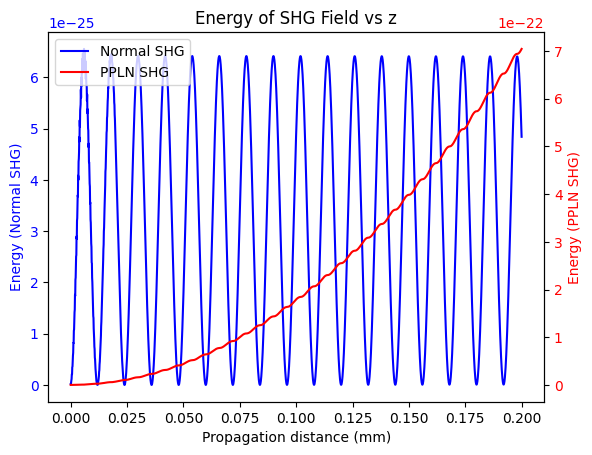

In [5]:
L = crystal_shg_normal.length
Nz = crystal_shg_normal.number_grid_points_z
z = np.linspace(0, L, Nz)*1e3

# Plot results
fig, ax = plt.subplots()

# Define the colors for each plot for consistency
color_normal = 'blue'
color_ppln = 'red'

# Plot the first data set
line1, = ax.plot(z, E2_normal, label='Normal SHG', color=color_normal)
ax.set_xlabel('Propagation distance (mm)')
ax.set_ylabel('Energy (Normal SHG)', color=color_normal)  # Set the color of the y-axis label
ax.tick_params(axis='y', labelcolor=color_normal)  # Set the tick colors to match the line color
ax.set_title('Energy of SHG Field vs z')

# Create a second y-axis that shares the same x-axis
ax2 = ax.twinx()
line2, = ax2.plot(z, E2_ppln, color=color_ppln, label='PPLN SHG')
ax2.set_ylabel('Energy (PPLN SHG)', color=color_ppln)  # Set the color of the second y-axis label
ax2.tick_params(axis='y', labelcolor=color_ppln)  # Set the tick colors to match the line color

# Add legends
lines = [line1, line2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='upper left')

plt.show()

In [12]:
lg_beam2D.beam_waist

0.01

In [12]:
A1_ppln, A2_ppln, E1_ppln, E2_ppln, _ = simulation_shg2D.run(lg_beam2D.Beam_array[0], parameters_shg_ppln, 1e-6, 1e-6)

iteration 0 sur 2000
Flattening took 5.221366882324219e-05 seconds
Correlate took 0.0001838207244873047 seconds
Convolve took 0.00011873245239257812 seconds
Correlate took 0.0001289844512939453 seconds
Convolve took 0.0001232624053955078 seconds
Correlate took 0.0010180473327636719 seconds
Convolve took 0.00024890899658203125 seconds
Correlate took 0.00018095970153808594 seconds
Convolve took 7.700920104980469e-05 seconds
Correlate took 0.00026798248291015625 seconds
Convolve took 6.604194641113281e-05 seconds
Correlate took 6.389617919921875e-05 seconds
Convolve took 0.00011086463928222656 seconds
Correlate took 0.00013399124145507812 seconds
Convolve took 8.702278137207031e-05 seconds
Correlate took 8.58306884765625e-05 seconds
Convolve took 6.771087646484375e-05 seconds
Correlate took 0.0001010894775390625 seconds
Convolve took 6.29425048828125e-05 seconds
Correlate took 5.793571472167969e-05 seconds
Convolve took 5.1975250244140625e-05 seconds
Correlate took 7.82012939453125e-05 se

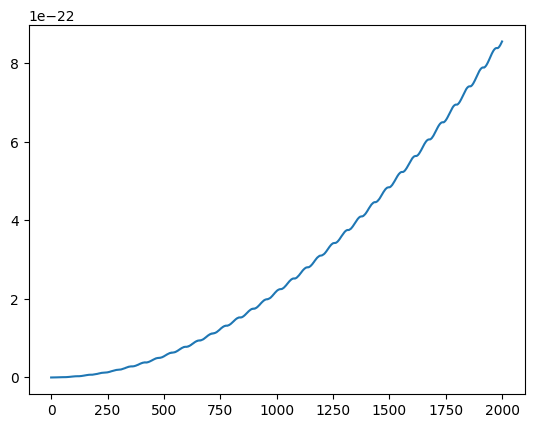

In [13]:
plt.plot(E2_ppln)

In [7]:
def th(y):
    w = gaussian.frequency_central * 2 * np.pi
    nsh = crystal_shg_normal.n_sh(w*2)
    c = 3e8
    wm = crystal_shg_normal.wavevector_mismatch()
    Dk = wm(w, w, w*2) - 2 * np.pi / (crystal_shg_normal.domain_width * 4)
    A02 = np.sum(np.abs(gaussian.frequency_amplitude)**2)
    deff = crystal_shg_normal.deff
    return w * y / (nsh * c) * deff * A02 * np.sinc(Dk * y / 2) * np.exp(-1j * Dk * y / 2)

def th2(y):
    w = gaussian.frequency_central * 2 * np.pi
    nsh = crystal_shg_ppln.n_sh(w*2)
    nf = crystal_shg_ppln.n_f(w)
    c = 3e8
    wm = crystal_shg_ppln.wavevector_mismatch()
    Dk = wm(w, w, w*2) - 2 * np.pi / (crystal_shg_ppln.domain_width*4)
    A0 = np.sum(np.abs(gaussian.frequency_amplitude))
    deff = crystal_shg_normal.deff
    return np.abs(A0) / np.cosh(w / (nsh * c) * np.sqrt((nsh/nf) * deff**2) * np.abs(A0) * y)

def th3(y):
    w = gaussian.frequency_central * 2 * np.pi
    nsh = crystal_shg_ppln.n_sh(w*2)
    nf = crystal_shg_ppln.n_f(w)
    c = 3e8
    wm = crystal_shg_ppln.wavevector_mismatch()
    Dk = wm(w, w, w*2) - 2 * np.pi / (crystal_shg_ppln.domain_width*4)
    A0 = np.sum(np.abs(gaussian.frequency_amplitude))
    deff = crystal_shg_normal.deff
    deff = 1
    return np.abs(A0) * np.sqrt(nf/nsh) * np.tanh(w / (nsh * c) * np.sqrt((nsh/nf) * deff**2) * np.abs(A0) * y)

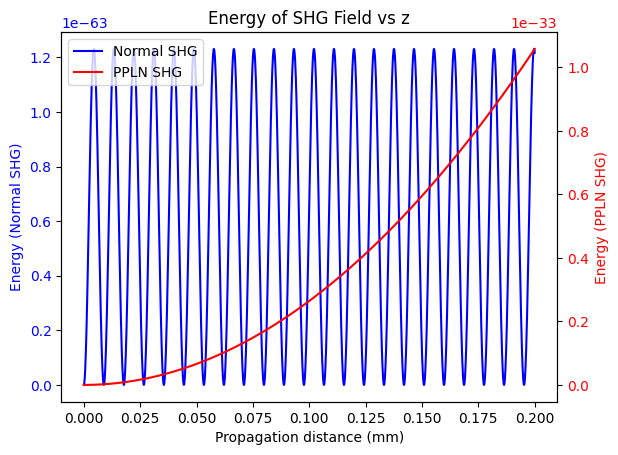

In [8]:
y = crystal_shg_normal.z_grid
# Plot results
fig, ax = plt.subplots()

# Define the colors for each plot for consistency
color_normal = 'blue'
color_ppln = 'red'

# Plot the first data set
line1, = ax.plot(z, np.abs(th(y))**2, label='Normal SHG', color=color_normal)
ax.set_xlabel('Propagation distance (mm)')
ax.set_ylabel('Energy (Normal SHG)', color=color_normal)  # Set the color of the y-axis label
ax.tick_params(axis='y', labelcolor=color_normal)  # Set the tick colors to match the line color
ax.set_title('Energy of SHG Field vs z')

# Create a second y-axis that shares the same x-axis
ax2 = ax.twinx()
line2, = ax2.plot(z, np.abs(th3(y))**2, color=color_ppln, label='PPLN SHG')
ax2.set_ylabel('Energy (PPLN SHG)', color=color_ppln)  # Set the color of the second y-axis label
ax2.tick_params(axis='y', labelcolor=color_ppln)  # Set the tick colors to match the line color

# Add legends
lines = [line1, line2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='upper left')

/Users/macoco/Desktop/colin_ecole/polymtl/polymtl_MA1/maîtrise/PPLN/simulations/.venv3_10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/macoco/Desktop/colin_ecole/polymtl/polymtl_MA1/maîtrise/PPLN/simulations/.venv3_10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/macoco/Desktop/colin_ecole/polymtl/polymtl_MA1/maîtrise/PPLN/simulations/.venv3_10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.

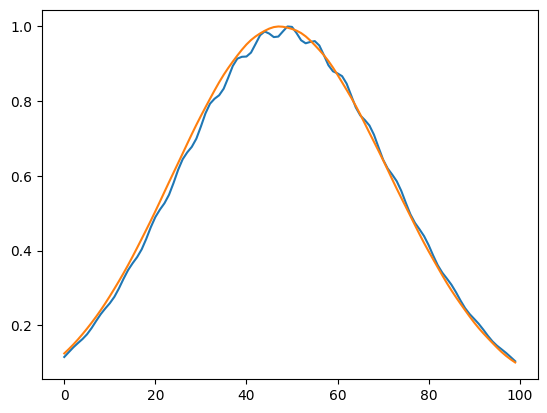

In [6]:
plt.plot(np.abs(A2_normal)/np.max(np.abs(A2_normal)))
plt.plot(np.abs(A2_ppln)/np.max(np.abs(A2_ppln)))

In [3]:
# general crystal parameters
crystal_shg = SHGCrystal(
    configuration='ppln', # Periodically poled lithium niobate
    medium='LiNbO3', # Medium
    number_grid_points_z=2000, # Number of grid points in z direction
    wavelength_central=1550e-9, # Central wavelength in meters
    fundamental='x', # Polarization of the fundamental wave
    second_harmonic='y', # Polarization of the second harmonic wave
    length=2e-4,
    ) # Length of the crystal in meters

parameters_shg = np.array(crystal_shg.poling_function(np.array(crystal_shg.domain_values)), dtype=np.float32)[:len(crystal_shg.z_grid)]

# Gaussian pulse
gaussian = GaussianPulse(
    wavelength_central=1550e-9,  # Central wavelength in meters
    wavelength_bandwidth=10e-9,  # Bandwidth in meters
    mean_power=60e-3,  # Mean power in Watts
    repetition_rate=61e6,  # Repetition rate in Hz
    number_of_grid_points=100, # Number of grid points
    wavelength_span=100e-9,  # Wavelength span in meters
    refractive_index_function=crystal_shg.n_f # Refractive index function
)

# Create a Beam instance with LG mode
lg_beam2D = Beam(
    width=10e-3, 
    num_points_x=5, 
    height=10e-3, 
    num_points_y=5,
    angular_frequency_grid=2*np.pi*gaussian.frequency_grid, 
    angular_frequency_amplitude=gaussian.frequency_amplitude,
    wave_number_func=crystal_shg.k_f,
    refractive_index_func=crystal_shg.n_f, 
    beam_waist=10e-3,
    mode='Lg', 
    max_azimuthal_index=1,
    max_radial_index=1,
    dimensions=2
)

lg_beam2D = Beam(
    width=10e-3, 
    num_points_x=5, 
    height=10e-3, 
    num_points_y=5,
    angular_frequency_grid=2*np.pi*gaussian.frequency_grid, 
    angular_frequency_amplitude=gaussian.frequency_amplitude,
    wave_number_func=crystal_shg.k_f,
    refractive_index_func=crystal_shg.n_f, 
    beam_waist=10e-3,
    mode='Lg', 
    max_azimuthal_index=1,
    max_radial_index=1,
    dimensions=2
)

simulation_shg1D = InteractionSHG(
    gaussian.wavelength_central, 
    gaussian.frequency_grid[-1]-gaussian.frequency_grid[0], 
    crystal_shg.length,
    gaussian.number_of_grid_points, 
    crystal_shg.number_grid_points_z, 
    crystal_shg.n_sh, 
    crystal_shg.n_sh,
    crystal_shg.k_f, 
    crystal_shg.k_sh, 
    crystal_shg.wavevector_mismatch,
    1e-3, 
    crystal_shg.domain_bounds, 
    gaussian.time_bandwidth,
    dimensions=1)

simulation_shg2D = InteractionSHG(
    gaussian.wavelength_central, 
    gaussian.frequency_grid[-1]-gaussian.frequency_grid[0], 
    crystal_shg.length,
    gaussian.number_of_grid_points, 
    crystal_shg.number_grid_points_z, 
    crystal_shg.n_sh, 
    crystal_shg.n_sh,
    crystal_shg.k_f, 
    crystal_shg.k_sh, 
    crystal_shg.wavevector_mismatch,
    crystal_shg.d, 
    crystal_shg.domain_bounds, 
    gaussian.time_bandwidth,
    dimensions=2, 
    X=lg_beam2D.width, 
    Y=lg_beam2D.height, 
    n_x=lg_beam2D.num_points_x, 
    wx=lg_beam2D.beam_waist)

simulation_shg3D = InteractionSHG(
    gaussian.wavelength_central, 
    gaussian.frequency_grid[-1]-gaussian.frequency_grid[0], 
    crystal_shg.length,
    gaussian.number_of_grid_points, 
    crystal_shg.number_grid_points_z, 
    crystal_shg.n_sh, 
    crystal_shg.n_sh,
    crystal_shg.k_f, 
    crystal_shg.k_sh, 
    crystal_shg.wavevector_mismatch,
    crystal_shg.d, 
    crystal_shg.domain_bounds, 
    gaussian.time_bandwidth,
    dimensions=3, 
    X=lg_beam2D.width, 
    Y=lg_beam2D.height, 
    n_x=lg_beam2D.num_points_x, 
    n_y=lg_beam2D.num_points_y, 
    wx=lg_beam2D.beam_waist, 
    wy=lg_beam2D.beam_waist)

domain_width/2 = 2.9869193857929135e-06 
dictretization step along z = 1.0000000000000001e-07


In [187]:
A1, A2, E1, E2, A2_evolution_z = simulation_shg1D.run(gaussian.frequency_amplitude, parameters_shg, 1e-6, 1e-6)

iteration 0 sur 1000
Flattening took 0.00020122528076171875 seconds
Correlate took 0.0005497932434082031 seconds
Convolve took 0.00045490264892578125 seconds
Correlate took 0.0001800060272216797 seconds
Convolve took 0.00013637542724609375 seconds
Correlate took 0.0006690025329589844 seconds
Convolve took 0.0010292530059814453 seconds
Correlate took 0.0010471343994140625 seconds
Convolve took 0.00014901161193847656 seconds
Correlate took 0.0002319812774658203 seconds
Convolve took 0.00010132789611816406 seconds
Correlate took 7.224082946777344e-05 seconds
Convolve took 5.1021575927734375e-05 seconds
Correlate took 0.00015306472778320312 seconds
Convolve took 5.793571472167969e-05 seconds
Correlate took 6.818771362304688e-05 seconds
Convolve took 4.696846008300781e-05 seconds
Nonlinear step took 0.015507936477661133 seconds
Linear step took 0.00010204315185546875 seconds
iteration 0 took 0.015800952911376953 seconds
iteration 1 sur 1000
Flattening took 1.4066696166992188e-05 seconds
Cor

In [4]:
A1, A2, E1, E2, A2_evolution_z = simulation_shg2D.run(lg_beam2D.Beam_array[0], parameters_shg, 1e-6, 1e-6)

iteration 0 sur 2000
Flattening took 3.2901763916015625e-05 seconds
Correlate took 0.0003540515899658203 seconds
Convolve took 0.00010704994201660156 seconds
Correlate took 0.0002732276916503906 seconds
Convolve took 0.00012373924255371094 seconds
Correlate took 0.0001010894775390625 seconds
Convolve took 0.0001862049102783203 seconds
Correlate took 0.0003218650817871094 seconds
Convolve took 0.0003361701965332031 seconds
Correlate took 0.00012373924255371094 seconds
Convolve took 0.00017404556274414062 seconds
Correlate took 0.0004100799560546875 seconds
Convolve took 0.00015878677368164062 seconds
Correlate took 0.00018906593322753906 seconds
Convolve took 0.00010919570922851562 seconds
Correlate took 0.00021505355834960938 seconds
Convolve took 0.00018715858459472656 seconds
Correlate took 0.00019502639770507812 seconds
Convolve took 0.00014901161193847656 seconds
Correlate took 0.0001308917999267578 seconds
Convolve took 0.0003230571746826172 seconds
Correlate took 0.00088405609130

In [39]:
A1, A2, E1, E2, A2_evolution_z = simulation_shg.run(lg_beam.Beam_array[0], parameters_shg, 1e-8, 1e-8)

iteration 0 sur 1000
Flattening took 0.00015687942504882812 seconds
Correlate took 0.007930278778076172 seconds
Convolve took 0.002850770950317383 seconds
Correlate took 0.0038208961486816406 seconds
Convolve took 0.0029840469360351562 seconds
Correlate took 0.0038950443267822266 seconds
Convolve took 0.003342151641845703 seconds
Correlate took 0.0031709671020507812 seconds
Convolve took 0.002521038055419922 seconds
Correlate took 0.0034110546112060547 seconds
Convolve took 0.003213644027709961 seconds
Correlate took 0.003000020980834961 seconds
Convolve took 0.002624988555908203 seconds
Correlate took 0.0024330615997314453 seconds
Convolve took 0.0032219886779785156 seconds
Correlate took 0.003945827484130859 seconds
Convolve took 0.0033931732177734375 seconds
Nonlinear step took 0.06581616401672363 seconds
Linear step took 0.0003380775451660156 seconds
iteration 0 took 0.06642365455627441 seconds
iteration 1 sur 1000
Flattening took 4.291534423828125e-05 seconds
Correlate took 0.0037

In [22]:
A1, A2, E1, E2, _ = simulation_shg.run(np.sum(np.sum(lg_beam.Beam_array[0],axis=1),axis=0), 3)

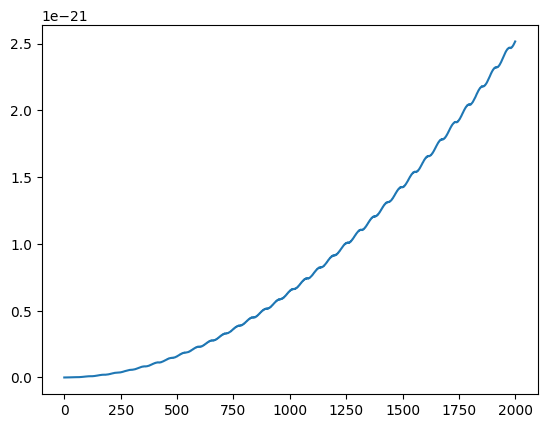

In [5]:
figure, ax = plt.subplots(1,1)

#ax.plot(np.abs(np.sum(np.abs(A2_evolution_z), axis=1)))
#ax.plot(np.real(np.abs(np.sum(A2, axis=0))))
#ax.plot(E1)
ax.plot(E2)
#ax.plot(np.abs(A2))
#ax.set_xlim([0, 1000])

In [7]:
x_step = np.abs(lg_beam2D.x[1] - lg_beam2D.x[0])
print(x_step)
x_step = lg_beam2D.width / lg_beam2D.num_points_x
print(x_step)

0.0025
0.002


In [4]:
A1, A2, E1, E2, A2_evolution_z = simulation_shg1D.run(gaussian.frequency_amplitude, parameters_shg, 1e-6, 1e-6)

iteration 0 sur 1000
Flattening took 0.000102996826171875 seconds
Correlate took 0.0005059242248535156 seconds
Convolve took 0.0001609325408935547 seconds
Correlate took 0.00057220458984375 seconds
Convolve took 0.0006189346313476562 seconds
Correlate took 0.0002989768981933594 seconds
Convolve took 0.0005917549133300781 seconds
Correlate took 0.00012493133544921875 seconds
Convolve took 0.0001690387725830078 seconds
Correlate took 0.00013113021850585938 seconds
Convolve took 0.00023293495178222656 seconds
Correlate took 0.00011587142944335938 seconds
Convolve took 6.985664367675781e-05 seconds
Correlate took 8.511543273925781e-05 seconds
Convolve took 7.128715515136719e-05 seconds
Correlate took 0.00012683868408203125 seconds
Convolve took 7.581710815429688e-05 seconds
Nonlinear step took 0.015127897262573242 seconds
Linear step took 0.00012803077697753906 seconds
iteration 0 took 0.015505075454711914 seconds
iteration 1 sur 1000
Flattening took 5.507469177246094e-05 seconds
Correlate

Text(0, 0.5, 'Power')

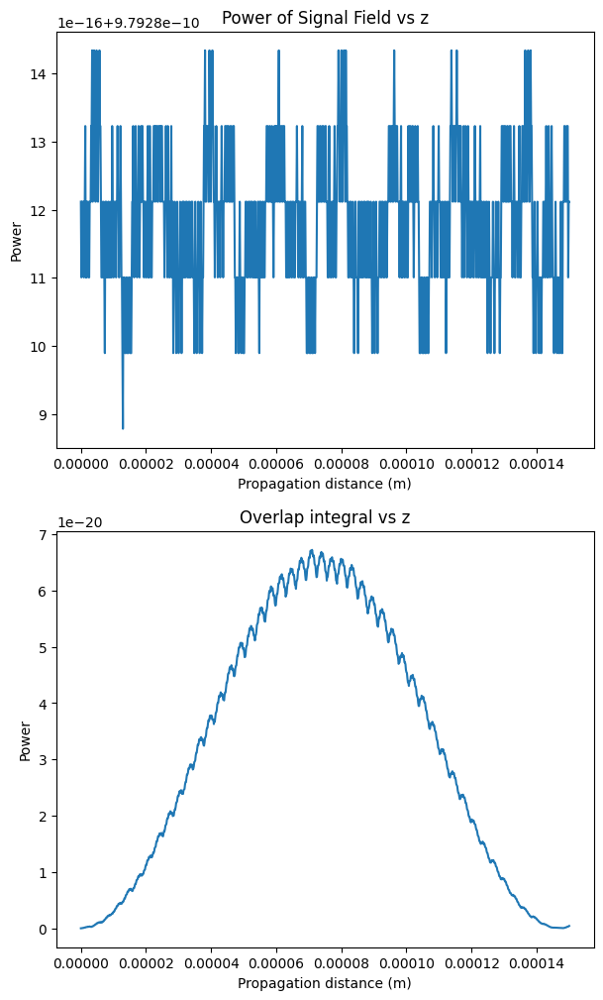

In [5]:
L = crystal_shg.length
Nz = crystal_shg.number_grid_points_z
# Plot results
fig, ax = plt.subplots(2, 1, figsize=(7, 12))

ax[0].plot(np.linspace(0, L, Nz), E1)
ax[0].set_title('Power of Signal Field vs z')
ax[0].set_xlabel('Propagation distance (m)')
ax[0].set_ylabel('Power')

ax[1].plot(np.linspace(0, L, Nz), E2)
ax[1].set_title('Overlap integral vs z')
ax[1].set_xlabel('Propagation distance (m)')
ax[1].set_ylabel('Power')

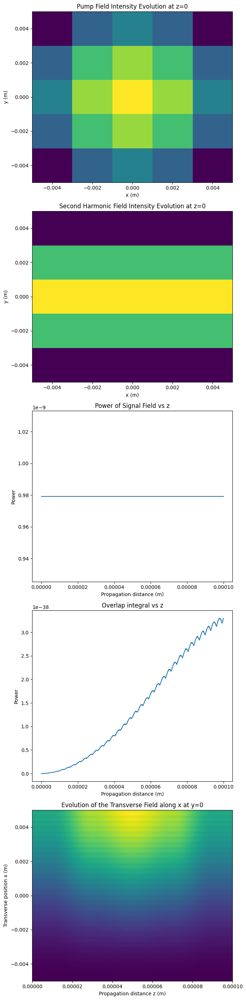

In [104]:

x = lg_beam.x
y = lg_beam.y
L = crystal_shg.length
Nz = crystal_shg.number_grid_points_z
# Plot results
fig, ax = plt.subplots(5, 1, figsize=(7, 28))
ax[0].imshow(np.abs(np.sum(A1, axis=2))**2, extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto', origin='lower')
ax[0].set_title('Pump Field Intensity Evolution at z=0')
ax[0].set_xlabel('x (m)')
ax[0].set_ylabel('y (m)')

ax[1].imshow(np.abs(np.sum(A2, axis=2))**2, extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto', origin='lower')
ax[1].set_title('Second Harmonic Field Intensity Evolution at z=0')
ax[1].set_xlabel('x (m)')
ax[1].set_ylabel('y (m)')

ax[2].plot(np.linspace(0, L, Nz), E1)
ax[2].set_title('Power of Signal Field vs z')
ax[2].set_xlabel('Propagation distance (m)')
ax[2].set_ylabel('Power')

ax[3].plot(np.linspace(0, L, Nz), E2)
ax[3].set_title('Overlap integral vs z')
ax[3].set_xlabel('Propagation distance (m)')
ax[3].set_ylabel('Power')

# Plotting the field evolution
ax[4].imshow(np.abs(np.sum(A2_evolution_z, axis=2))**2, extent=[0, L, y.min(), y.max()], aspect='auto', origin='lower', cmap='viridis')
ax[4].set_title('Evolution of the Transverse Field along x at y=0')
ax[4].set_xlabel('Propagation distance z (m)')
ax[4].set_ylabel('Transverse position x (m)')
plt.tight_layout()
plt.show()

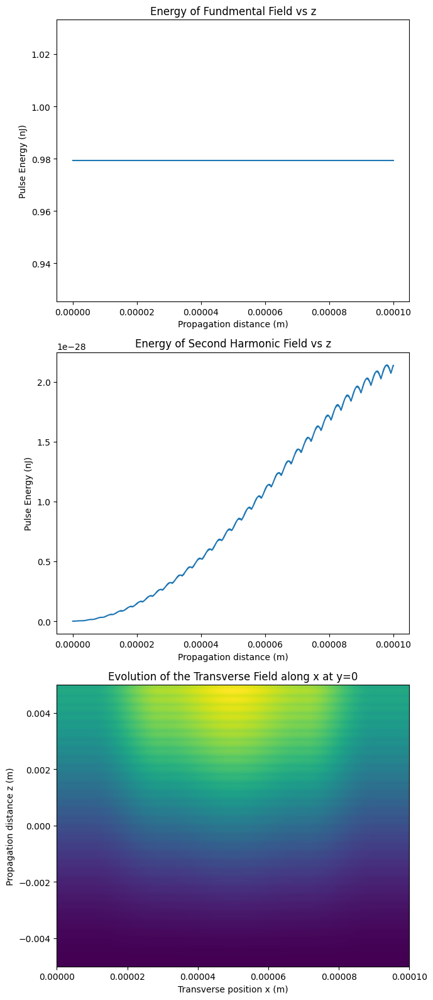

In [108]:
x = lg_beam.x
y = lg_beam.y
L = crystal_shg.length
Nz = crystal_shg.number_grid_points_z
# Plot results
fig, ax = plt.subplots(3, 1, figsize=(7, 16))

ax[0].plot(np.linspace(0, L, Nz), E1*1e9)
ax[0].set_title('Energy of Fundmental Field vs z')
ax[0].set_xlabel('Propagation distance (m)')
ax[0].set_ylabel('Pulse Energy (nJ)')

ax[1].plot(np.linspace(0, L, Nz), E2*1e9)
ax[1].set_title('Energy of Second Harmonic Field vs z')
ax[1].set_xlabel('Propagation distance (m)')
ax[1].set_ylabel('Pulse Energy (nJ)')

# Plotting the field evolution
ax[2].imshow(np.abs(A2_evolution_z)**2, extent=[0, L, y.min(), y.max()], aspect='auto', origin='lower', cmap='viridis')
ax[2].set_title('Evolution of the Transverse Field along x at y=0')
ax[2].set_xlabel('Transverse position x (m)')
ax[2].set_ylabel('Propagation distance z (m)')
plt.tight_layout()
plt.show()


In [110]:
import numpy as np

# Definitions and formulas
def dk(x, y, A, B, C):
    return A*(x + y) - B*x - C*y

def alpha(x, sigma_x):
    return np.exp(-x**2 / (2 * sigma_x**2))

def pm(x, y, z_start, z_stop, A, B, C):
    delta_k = dk(x, y, A, B, C)
    z_length = z_stop - z_start
    return z_length * np.sinc(z_length / 2 * delta_k / np.pi) * np.exp(-1j * delta_k * z_length / 2)

def phi_num(x, y, z, A, B, C):
    return np.exp(-1j * dk(x, y, A, B, C) * z)

def f_a(x, y, z, coupling, A, B, C, pump_width):
    return -1j * coupling * alpha(x + y, pump_width) * phi_num(x, y, z, A, B, C)

def f_b(x, y, z, coupling, A, B, C, pump_width):
    return f_a(y, x, z, coupling, A, B, C, pump_width)

def calc_PDC(coupling, w_start, w_stop, w_steps, z_start, z_stop, z_steps, A, B, C, pump_width):
    wRange = np.linspace(w_start, w_stop, w_steps)
    zRange = np.linspace(z_start, z_stop, z_steps)
    w_step = wRange[1] - wRange[0]
    z_step = zRange[1] - zRange[0]

    results = {'Va': {}, 'Ua': {}, 'Vb': {}, 'Ub': {}, 'fa': {}, 'fb': {}}

    # Initial conditions
    Vinitial = np.zeros((wRange.size, wRange.size), dtype=complex)
    Uinitial = np.identity(wRange.size, dtype=complex) / w_step

    # Setup initial conditions in results
    for z in zRange:
        z_index = str(z)
        results['Va'][z_index] = Vinitial.copy()
        results['Ua'][z_index] = Uinitial.copy()
        results['Vb'][z_index] = Vinitial.copy()
        results['Ub'][z_index] = Uinitial.copy()

    # Compute fa and fb at each z position
    Y, X = np.meshgrid(wRange, wRange)
    for z in zRange:
        z_index = str(z)
        results['fa'][z_index] = f_a(X, Y, z, coupling, A, B, C, pump_width)
        results['fb'][z_index] = f_b(X, Y, z, coupling, A, B, C, pump_width)

    return results


# Example parameters

# Coupling value giving the overall efficiency of the conversion process.
# It includes the pump power and the nonlinearity of the medium.
coupling = 0.75
# Width of the Gaussian pump field amplitude (not intensity) in sigma. 
pump_width = 0.96231155
# Inverse group velocity of the pump beam
A = 3.0
# Inverse group velocity of the A beam
B = 4.5
# Inverse group velocity of the C beam
C = 1.5

# z_start gives the beginning of the crystal and z_stop its end
# (z_start should remain at 0 since the analytic formulas in the code
# assume a waveguide starting at 0.)
z_start = 0 
z_stop = 2

# Wavelength range to consider where the process is centered at 0. The values
# have to cover all excited frequencies. 
# (In some analysis scripts it is assumed  that w_start and w_stop are
# symmetric about zero.)
w_start = -5
w_stop = 5
# Sampling steps for the frequency degree of freedom
w_steps = 500

# Sampling steps for the propagation over the length of the crystal
# (Warning: A too small sampling value will lead to grave errors in the
# z-integration)
z_steps = 500

# Example parameters
results = calc_PDC(
    coupling=coupling,
    w_start=w_start,
    w_stop=w_stop,
    w_steps=w_steps,
    z_start=z_start,
    z_stop=z_stop,
    z_steps=z_steps,
    A=A,
    B=B,
    C=C,
    pump_width=pump_width
)

# You can then access and manipulate these results as needed, for example:
print(results['Va'][str(10.)])  # Example of accessing the initial Va array


KeyError: '10.0'

In [114]:
# You can then access and manipulate these results as needed, for example:
print(results['Ua'][str(2.)])  # Example of accessing the initial Va array

[[49.9+0.j  0. +0.j  0. +0.j ...  0. +0.j  0. +0.j  0. +0.j]
 [ 0. +0.j 49.9+0.j  0. +0.j ...  0. +0.j  0. +0.j  0. +0.j]
 [ 0. +0.j  0. +0.j 49.9+0.j ...  0. +0.j  0. +0.j  0. +0.j]
 ...
 [ 0. +0.j  0. +0.j  0. +0.j ... 49.9+0.j  0. +0.j  0. +0.j]
 [ 0. +0.j  0. +0.j  0. +0.j ...  0. +0.j 49.9+0.j  0. +0.j]
 [ 0. +0.j  0. +0.j  0. +0.j ...  0. +0.j  0. +0.j 49.9+0.j]]


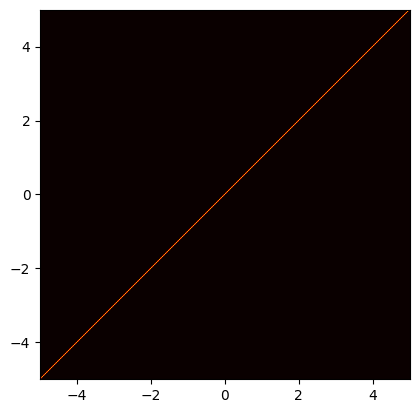

In [118]:
ua = results['Ub'][str(2.)]
im = plt.imshow(np.abs(ua), origin="lower", cmap=plt.cm.hot, \
        extent=(w_start, w_stop, w_start, w_stop) )